<h1 style="font-size:30px;">DeepLabv3+ with EfficientNetv2_S Backbone</h1>

In [ ]:
!pip install -q git+https://github.com/keras-team/keras-cv.git --upgrade

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 16.4 MB/s eta 0:00:00


In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

In [ ]:
#drive_path = "/content/drive/MyDrive/Colab Notebooks/K5_EfficientNet"

In [ ]:
import os
import requests
from zipfile import ZipFile
import glob
from dataclasses import dataclass

import random
import numpy as np
import cv2

import tensorflow as tf
import keras_cv

import matplotlib.pyplot as plt

## 재현성을 위한 씨앗 설정

In [ ]:
def system_config(SEED_VALUE):
    # Set python `random` seed.
    # Set `numpy` seed
    # Set `tensorflow` seed.
    random.seed(SEED_VALUE)
    tf.keras.utils.set_random_seed(SEED_VALUE)
    os.environ["CUDA_VISIBLE_DEVICES"] = '0'
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    os.environ['TF_USE_CUDNN'] = "true"

system_config(SEED_VALUE=42)

## 데이터 세트 다운로드 및 추출

In [ ]:
# 다운로드 및 데이터 세트..
def download_and_unzip(url, save_path):

    print("Downloading and extracting assets...", end="")
    file = requests.get(url)
    open(save_path, "wb").write(file.content)

    try:
        # 타르파일 추출.
        if save_path.endswith(".zip"):
            with ZipFile(save_path) as zip:
                zip.extractall(os.path.split(save_path)[0])

        print("Done")
    except:
        print("Invalid file")

In [ ]:
DATASET_URL = r"https://www.dropbox.com/scl/fi/1371bxihgw1m60b40yhlt/WF_train.zip?rlkey=no7nujiesktbh3k3q9e8hr7bf&st=zkev8ncx&dl=1"
DATASET_DIR = "WF_train"
DATASET_ZIP_PATH = os.path.join(os.getcwd(), f"{DATASET_DIR}.zip")

# 데이터 세트가 없는 경우 다운로드.
if not os.path.exists(DATASET_DIR):
    download_and_unzip(DATASET_URL, DATASET_ZIP_PATH)
    os.remove(DATASET_ZIP_PATH)

## 구성

### 데이터 구성

In [ ]:
@dataclass(frozen=True)
class DatasetConfig:
    IMAGE_SIZE:        tuple = (256, 256)
    BATCH_SIZE:          int = 8
    NUM_CLASSES:         int = 2
    BRIGHTNESS_FACTOR: float = 0.2
    CONTRAST_FACTOR:   float = 0.2

### 교육 구성

In [ ]:
@dataclass(frozen=True)
class TrainingConfig:
    MODEL:           str = "efficientnetv2_s_imagenet"
    EPOCHS:          int = 100
    LEARNING_RATE: float = 1e-4
    CKPT_DIR:        str = os.path.join("checkpoints_"+"_".join(MODEL.split("_")[:2]),
                                        "deeplabv3_plus_"+"_".join(MODEL.split("_")[:2])+".weights.h5")
    LOGS_DIR:        str = "logs_"+"_".join(MODEL.split("_")[:2])

In [ ]:
train_config = TrainingConfig()
data_config = DatasetConfig()

## 데이터 세트 준비

In [ ]:
DATASET_DIR = "WF_train"
data_images = glob.glob(os.path.join(DATASET_DIR, "Images", "*.png"))
data_masks = glob.glob(os.path.join(DATASET_DIR, "Masks", "*.png"))

# 데이터 준비 전에 데이터 경로를 정렬합니다.
zipped_data = list(zip(data_images, data_masks))
random.shuffle(zipped_data)
data_images, data_masks = zip(*zipped_data)
data_images = list(data_images)
data_masks = list(data_masks)

In [ ]:
org_data = tf.data.Dataset.from_tensor_slices((data_images, data_masks))

### 열차 유효성 검사 분할

We are maintaining a **95-5** split ratio for training and validation samples respectively.

In [ ]:
SPLIT_RATIO = 0.2
# 검증 샘플 수 결정
NUM_VAL = int(len(data_images) * SPLIT_RATIO)

# 데이터 세트를 훈련 및 검증 세트로 분할
train_data = org_data.skip(NUM_VAL)
valid_data = org_data.take(NUM_VAL)

In [ ]:
print(f"Train samples: {train_data.cardinality().numpy()}")
print(f"Validation samples: {valid_data.cardinality().numpy()}")

Train samples: 869
Validation samples: 217


### 데이터 및 임계값 마스크 로드

In [ ]:
def read_image_mask(image_path, mask=False, size = data_config.IMAGE_SIZE):
    image = tf.io.read_file(image_path)

    if mask:
        image = tf.image.decode_jpeg(image, channels=1)
        image.set_shape([None, None, 1])
        image = tf.image.resize(images=image, size=size, method = "bicubic")

        image_mask = tf.zeros_like(image)
        cond = image >=200
        updates = tf.ones_like(image[cond])
        image_mask = tf.tensor_scatter_nd_update(image_mask, tf.where(cond), updates)
        image = tf.cast(image_mask, tf.uint8)

    else:
        image = tf.image.decode_jpeg(image, channels=3)
        image.set_shape([None, None, 3])
        image = tf.image.resize(images=image, size=size, method = "bicubic")
        image = tf.cast(tf.clip_by_value(image, 0., 255.), tf.float32)

    return image

In [ ]:
def load_data(image_list, mask_list):
    image = read_image_mask(image_list)
    mask  = read_image_mask(mask_list, mask=True)
    return {"images":image, "segmentation_masks":mask}

In [ ]:
train_ds = train_data.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
valid_ds = valid_data.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)

### 이미지 및 분할 마스크 풀기

'언팩키지_입력'은 다음에서 입력을 푸는 데 사용되는 유틸리티 함수입니다
'(이미지, 분할_마스크)'의 튜플에 대한 사전 형식입니다. 이 형식은 나중에 사용됩니다
이미지 및 분할 마스크와 모델 예측을 시각화하는 데 사용됩니다.

In [ ]:
def unpackage_inputs(inputs):
    images = inputs["images"]
    segmentation_masks = inputs["segmentation_masks"]
    return images, segmentation_masks

## 지상 진실 시각화

In [ ]:
# 클래스 ID를 색상에 사전 매핑합니다.
id2color = {
    0: (0,  0,    0),    # 배경
    1: (102, 204, 255),  # 불
 }

In [ ]:
# 단일 채널 마스크 표현을 RGB 마스크로 변환하는 기능.
def num_to_rgb(num_arr, color_map=id2color):

    # 단일 레이어 = np.squeeze(num_ar)
    output = np.zeros(num_arr.shape[:2]+(3,))

    for k in color_map.keys():
        output[num_arr==k] = color_map[k]

    return output.astype(np.uint8)

In [ ]:
# RGB 이미지 위에 분할 지도를 오버레이하는 기능입니다.
def image_overlay(image, segmented_image):

    alpha = 1.0 # 원본 이미지의 투명성.
    beta  = 0.7 # 세그먼트 맵의 투명성.
    gamma = 0.0 # 각 합계에 스칼라 추가.

    image = image.astype(np.uint8)

    segmented_image = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR)

    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    image = cv2.addWeighted(image, alpha, segmented_image, beta, gamma, image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    return image

해당 지상 진실 마스크와 함께 지상 진실 이미지 몇 개를 표시하고 이미지 입력에 오버레이합니다.

In [ ]:
def display_image_and_mask(data_list, title_list, figsize, color_mask=False, color_map=id2color):

    # 그레이스케일 분할 맵에서 RGB 세그먼트 맵 생성 맵 생성.
    rgb_gt_mask = num_to_rgb(data_list[1], color_map=color_map)
    mask_to_overlay = rgb_gt_mask

    if len(data_list)==3:
        rgb_pred_mask = num_to_rgb(data_list[-1], color_map=color_map)
        mask_to_overlay = rgb_pred_mask

    # 오버레이된 이미지 만들기.
    overlayed_image = image_overlay(data_list[0], mask_to_overlay)

    data_list.append(overlayed_image)

    fig, axes = plt.subplots(nrows=1, ncols=len(data_list), figsize=figsize)

    for idx, axis in enumerate(axes.flat):
        axis.set_title(title_list[idx])
        if title_list[idx] == "GT Mask":
            if color_mask:
                axis.imshow(rgb_gt_mask)
            else:
                axis.imshow(data_list[1], cmap="gray")

        elif title_list[idx] == "Pred Mask":
            if color_mask:
                axis.imshow(rgb_pred_mask)
            else:
                axis.imshow(data_list[-1], cmap="gray")

        else:
            axis.imshow(data_list[idx])

        axis.axis('off')

    plt.show()

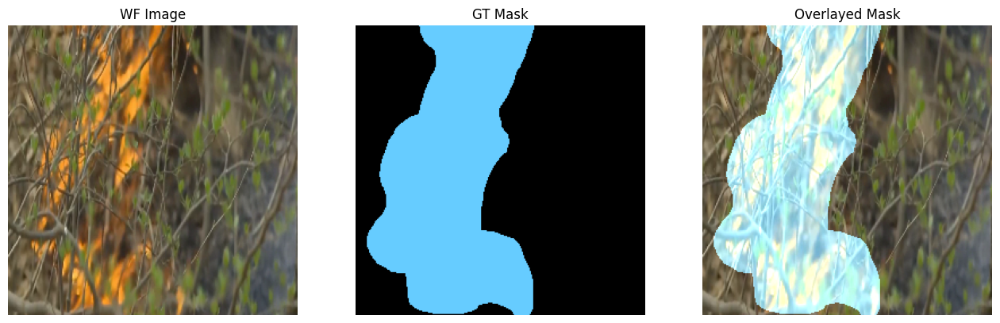

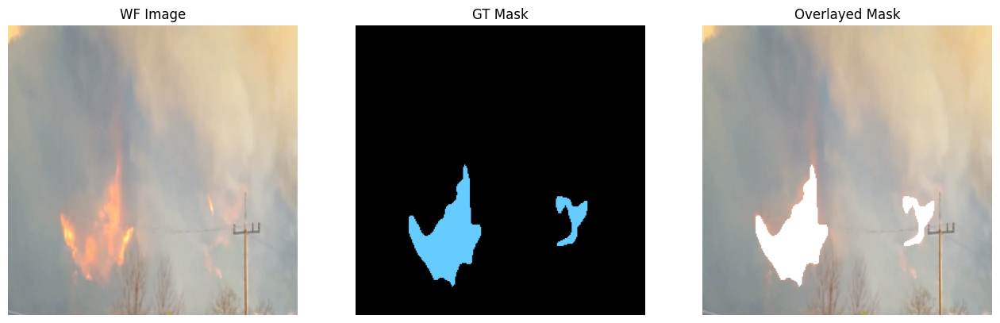

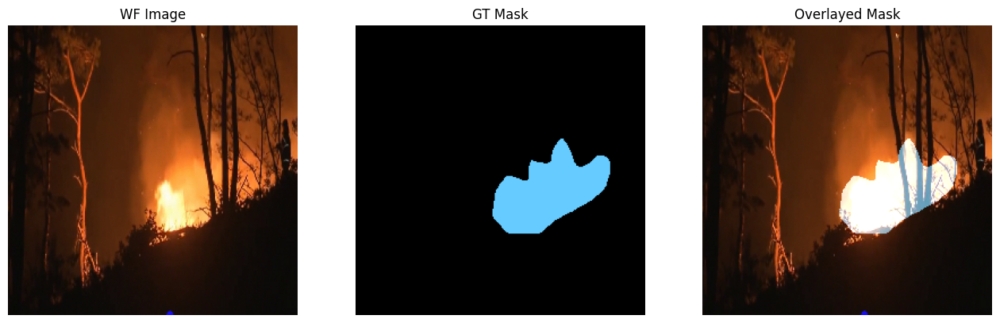

In [ ]:
plot_train_ds = train_ds.map(unpackage_inputs).batch(3)
image_batch, mask_batch = next(iter(plot_train_ds.take(1)))

titles = ["WF Image", "GT Mask", "Overlayed Mask"]

for image, gt_mask in zip(image_batch, mask_batch):

    gt_mask = tf.squeeze(gt_mask, axis=-1).numpy()
    display_image_and_mask([image.numpy().astype(np.uint8), gt_mask],
                           title_list=titles,
                           figsize=(16,6),
                           color_mask=True)

## 데이터 증강

다음 변환을 증강으로 사용합니다:
* RandomFlip(기본 모드는 **"수평"**이며 확률은 '0.5'입니다.)
* 무작위 밝기
* 무작위 대조

In [ ]:
augment_fn = tf.keras.Sequential(
    [
        keras_cv.layers.RandomFlip(),
        keras_cv.layers.RandomBrightness(factor=data_config.BRIGHTNESS_FACTOR,
                                         value_range=(0, 255)),
        keras_cv.layers.RandomContrast(factor=data_config.CONTRAST_FACTOR,
                                       value_range=(0, 255)),
    ]
)

최종 교육 및 검증 데이터 세트를 준비하겠습니다.

In [ ]:
train_dataset = (
                train_ds.shuffle(data_config.BATCH_SIZE)
                .map(augment_fn, num_parallel_calls=tf.data.AUTOTUNE)
                .batch(data_config.BATCH_SIZE)
                .map(unpackage_inputs)
                .prefetch(buffer_size=tf.data.AUTOTUNE)
)

valid_dataset = (
                valid_ds.batch(data_config.BATCH_SIZE)
                .map(unpackage_inputs)
                .prefetch(buffer_size=tf.data.AUTOTUNE)
)

### 증강 데이터 시각화

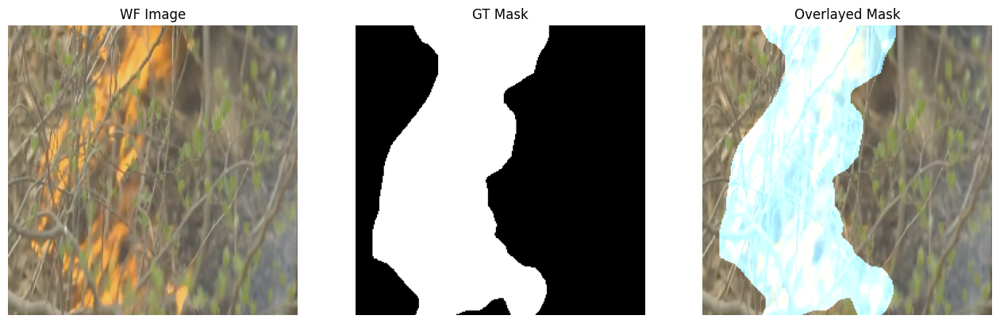

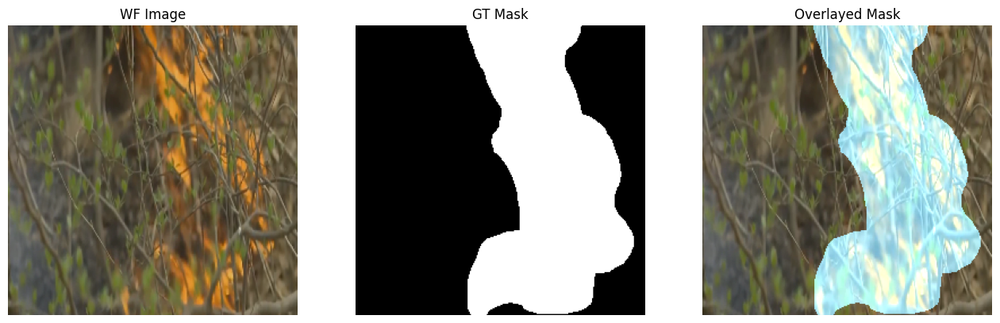

In [ ]:
image_batch, aug_mask_batch = next(iter(train_dataset.take(1)))

titles = ["WF Image", "GT Mask", "Overlayed Mask"]

for idx, (image, gt_mask) in enumerate(zip(image_batch, aug_mask_batch)):
    if idx > 1:
        break
    gt_mask = tf.squeeze(gt_mask, axis=-1).numpy()
    display_image_and_mask([image.numpy().astype(np.uint8), gt_mask],
                           title_list=titles,
                           figsize=(16,6),
                           color_mask=False)

## 모델 아키텍처

딥랩브3 헤드 위에 '효율적인 netv2_s_imagenet' 특징 추출기를 사용합니다.

In [ ]:
backbone = keras_cv.models.EfficientNetV2Backbone.from_preset(preset = train_config.MODEL,
                                                          input_shape=data_config.IMAGE_SIZE+(3,),
                                                          load_weights = True)
model = keras_cv.models.segmentation.DeepLabV3Plus(
        num_classes=data_config.NUM_CLASSES, backbone=backbone,
    )
print(model.summary())

Model: "deep_lab_v3_plus_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ functional_9 (Functional) │ [(None, 64, 64, 48),   │     20,331,360 │ input_layer_9[0][0]    │
│                           │ (None, 8, 8, 1280)]    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_pyramid_pooling_1 │ (None, 8, 8, 256)      │      9,836,544 │ functional_9[0][1]     │
│ (SpatialPyramidPooling)   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder_output_upsampling │ (None, 64, 64, 256)    │              0 │ spatial_pyramid_pooli… │
│ (UpSampling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_16             │ (None, 64, 64, 48)     │          2,496 │ functional_9[0][0]     │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 64, 64, 304)    │              0 │ encoder_output_upsamp… │
│ (Concatenate)             │                        │                │ sequential_16[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_17             │ (None, 256, 256, 2)    │         79,360 │ concatenate_1[0][0]    │
│ (Sequential)              │                        │                │                        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 30,249,760 (115.39 MB)

 Trainable params: 30,092,208 (114.79 MB)

 Non-trainable params: 157,552 (615.44 KB)

None


## 평가 지표

In [ ]:
def mean_iou(y_true, y_pred):

    # 모델 출력에서 총 클래스 수를 가져옵니다.
    num_classes = y_pred.shape[-1]

    y_true = tf.squeeze(y_true, axis=-1)

    y_true = tf.one_hot(tf.cast(y_true, tf.int32), num_classes, axis=-1)
    y_pred = tf.one_hot(tf.math.argmax(y_pred, axis=-1), num_classes, axis=-1)

    # 교차점: |G ∩ P|. 모양: (배치_크기, num_classes)
    intersection = tf.math.reduce_sum(y_true * y_pred, axis=(1, 2))

    # 총합: |G| + |P|. 모양: (배치_크기, num_classes)
    total = tf.math.reduce_sum(y_true, axis=(1, 2)) + tf.math.reduce_sum(y_pred, axis=(1, 2))

    union = total - intersection

    is_class_present =  tf.cast(tf.math.not_equal(total, 0), dtype=tf.float32)
    num_classes_present = tf.math.reduce_sum(is_class_present, axis=1)

    iou = tf.math.divide_no_nan(intersection, union)
    iou = tf.math.reduce_sum(iou, axis=1) / num_classes_present

    # 배치 축에서 평균을 계산합니다.모양: 확장
    mean_iou = tf.math.reduce_mean(iou)

    return mean_iou

### 텐서보드 및 모델체크포인트 콜백

In [ ]:
def get_callbacks(
    train_config,
    monitor="val_mean_iou",
    mode="max",
    save_weights_only=True,
    save_best_only=True,
):

    # 기록을 위해 텐서보드 콜백을 초기화합니다.
    tensorboard_callback = tf.keras.callbacks.TensorBoard(
        log_dir=train_config.LOGS_DIR,
        histogram_freq=20,
        write_graph=False,
        update_freq="epoch",
    )


    # 최적의 모델 가중치를 저장하는 경우 파일 경로 업데이트.
    if save_weights_only:
        checkpoint_filepath = train_config.CKPT_DIR

    model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        filepath=checkpoint_filepath,
        save_weights_only=save_weights_only,
        monitor=monitor,
        mode=mode,
        save_best_only=save_best_only,
        verbose=1,
    )

    return [tensorboard_callback, model_checkpoint_callback]

## 모델을 훈련하다

이제 모델별로 정의된 구성을 사용하여 모델을 만들고, 모델 적합하게 만드는 구성을 사용하여 모델을 만들 수 있습니다.

In [ ]:
# 모델 구축

# 전화 주문 부서 부탁드립니다..
callbacks = get_callbacks(train_config)

# 손실 정의.
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)

# (양식의) 서류..
model.compile(
    optimizer=tf.keras.optimizers.Adam(train_config.LEARNING_RATE),
    loss=loss_fn,
    metrics=["accuracy", mean_iou],
)

In [ ]:
# 모델을 훈련, 각 시대의 유효성을 검사합니다..
history = model.fit(
    train_dataset,
    epochs=train_config.EPOCHS,
    validation_data=valid_dataset,
    callbacks=callbacks
)

Epoch 1/100
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step - accuracy: 0.8667 - loss: 0.3467 - mean_iou: 0.5118
Epoch 1: val_mean_iou improved from -inf to 0.55807, saving model to checkpoints_efficientnetv2_s/deeplabv3_plus_efficientnetv2_s.weights.h5
109/109 ━━━━━━━━━━━━━━━━━━━━ 183s 789ms/step - accuracy: 0.8671 - loss: 0.3458 - mean_iou: 0.5122 - val_accuracy: 0.8691 - val_loss: 0.5158 - val_mean_iou: 0.5581
Epoch 2/100
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step - accuracy: 0.9444 - loss: 0.1496 - mean_iou: 0.6522
Epoch 2: val_mean_iou improved from 0.55807 to 0.66321, saving model to checkpoints_efficientnetv2_s/deeplabv3_plus_efficientnetv2_s.weights.h5
109/109 ━━━━━━━━━━━━━━━━━━━━ 68s 620ms/step - accuracy: 0.9444 - loss: 0.1495 - mean_iou: 0.6523 - val_accuracy: 0.9429 - val_loss: 0.1958 - val_mean_iou: 0.6632
Epoch 3/100
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step - accuracy: 0.9531 - loss: 0.1209 - mean_iou: 0.6881
Epoch 3: val_mean_iou improved from 0.66321 to 0.72338, saving mod

#### 좋은 모델 가중 모델 가중치

In [ ]:
model.load_weights(train_config.CKPT_DIR)

#### 평가 수행

In [ ]:
evaluate = model.evaluate(valid_dataset)

28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 188ms/step - accuracy: 0.9837 - loss: 0.0499 - mean_iou: 0.8466


Bắt đầu cho ảnh test *vào bold text **bold text**

## 좋은 모델 및 예측 모델

이제 딥랩V3의 모델 훈련 모델이 완료되었으며 몇 표본 이미지를 사용하여 테스트합니다.

In [ ]:
# 다운로드 및 데이터 세트.
def download_and_unzip(url, save_path):

    print("Downloading and extracting assets...", end="")
    file = requests.get(url)
    open(save_path, "wb").write(file.content)

    try:
        # 타르파일 추출.
        if save_path.endswith(".zip"):
            with ZipFile(save_path) as zip:
                zip.extractall(os.path.split(save_path)[0])

        print("Done")
    except:
        print("Invalid file")

In [ ]:
DATASET_URL = r"https://www.dropbox.com/scl/fi/mkok5n9vvzwcfk8l7nojl/WF_test.zip?rlkey=5o4py3jsehnsuhebozcd4k9dn&st=bnbgoex7&dl=1"
DATASET_DIR = "WF_test"
DATASET_ZIP_PATH = os.path.join(os.getcwd(), f"{DATASET_DIR}.zip")

# 데이터 세트가 존재하지 않는 경우 다운로드.
if not os.path.exists(DATASET_DIR):
    download_and_unzip(DATASET_URL, DATASET_ZIP_PATH)
    os.remove(DATASET_ZIP_PATH)

In [ ]:
DATASET_DIR = "WF_test"
data_images = glob.glob(os.path.join(DATASET_DIR, "Images", "*.png"))
data_masks = glob.glob(os.path.join(DATASET_DIR, "Masks", "*.png"))

# 데이터 준비 전에 데이터 경로 섞기.
zipped_data = list(zip(data_images, data_masks))
random.shuffle(zipped_data)
data_images, data_masks = zip(*zipped_data)
data_images = list(data_images)
data_masks = list(data_masks)

In [ ]:
org_data = tf.data.Dataset.from_tensor_slices((data_images, data_masks))

In [ ]:
SPLIT_RATIO = 1
# 검증 샘플 수 결정
NUM_VAL = int(len(data_images) * SPLIT_RATIO)

# 데이터 세트를 기차 및 유효성 검사 세트 분할
train_data = org_data.take(NUM_VAL)
valid_data = org_data.take(NUM_VAL)

In [ ]:
print(f"Train samples: {train_data.cardinality().numpy()}")
print(f"Validation samples: {valid_data.cardinality().numpy()}")

Train samples: 36
Validation samples: 36


데이터 및 임계값 마스크

In [ ]:
def read_image_mask(image_path, mask=False, size = data_config.IMAGE_SIZE):
    image = tf.io.read_file(image_path)

    if mask:
        image = tf.image.decode_jpeg(image, channels=1)
        image.set_shape([None, None, 1])
        image = tf.image.resize(images=image, size=size, method = "bicubic")

        image_mask = tf.zeros_like(image)
        cond = image >=1
        updates = tf.ones_like(image[cond])
        image_mask = tf.tensor_scatter_nd_update(image_mask, tf.where(cond), updates)
        image = tf.cast(image_mask, tf.uint8)

    else:
        image = tf.image.decode_jpeg(image, channels=3)
        image.set_shape([None, None, 3])
        image = tf.image.resize(images=image, size=size, method = "bicubic")
        image = tf.cast(tf.clip_by_value(image, 0., 255.), tf.float32)

    return image

In [ ]:
def load_data(image_list, mask_list):
    image = read_image_mask(image_list)
    mask  = read_image_mask(mask_list, mask=True)
    return {"images":image, "segmentation_masks":mask}

In [ ]:
train_ds = train_data.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
valid_ds = valid_data.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)

In [ ]:
def unpackage_inputs(inputs):
    images = inputs["images"]
    segmentation_masks = inputs["segmentation_masks"]
    return images, segmentation_masks

In [ ]:
# 사전 매핑 클래스 ID입니다..
id2color = {
    0: (0,  0,    0),    # Background
    1: (102, 204, 255),  # Waterbody
 }

In [ ]:
# 단일 채널 마스크 표현을 RGB 마스크 표현하려면 기능.
def num_to_rgb(num_arr, color_map=id2color):

    # 단일 레이어 = np.squeeze(num_ar)
    output = np.zeros(num_arr.shape[:2]+(3,))

    for k in color_map.keys():
        output[num_arr==k] = color_map[k]

    return output.astype(np.uint8)

In [ ]:
# RGB 이미지 위에 분할 지도를 오버레이하는 기능.
def image_overlay(image, segmented_image):

    alpha = 1.0 # 원본 이미지의 투명성.
    beta  = 0.7 # 분할 지도의 투명성.
    gamma = 0.0 # 각 합계에 스칼라 추가.

    image = image.astype(np.uint8)

    segmented_image = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR)

    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    image = cv2.addWeighted(image, alpha, segmented_image, beta, gamma, image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    return image

해당 접지 마스크와 함께 접지 이미지를 표시할 수 있으며 이미지 입력에 오버레이 이미지를 표시합니다.

In [ ]:
def display_image_and_mask(data_list, title_list, figsize, color_mask=False, color_map=id2color):

    # 그레이스케일 분할 맵에서 RGB 세그먼트 맵 생성 맵 생성.
    rgb_gt_mask = num_to_rgb(data_list[1], color_map=color_map)
    mask_to_overlay = rgb_gt_mask

    if len(data_list)==3:
        rgb_pred_mask = num_to_rgb(data_list[-1], color_map=color_map)
        mask_to_overlay = rgb_pred_mask

    # 오버레이된 이미지를 만듭니다..
    overlayed_image = image_overlay(data_list[0], mask_to_overlay)

    data_list.append(overlayed_image)

    fig, axes = plt.subplots(nrows=1, ncols=len(data_list), figsize=figsize)

    for idx, axis in enumerate(axes.flat):
        axis.set_title(title_list[idx])
        if title_list[idx] == "GT Mask":
            if color_mask:
                axis.imshow(rgb_gt_mask)
            else:
                axis.imshow(data_list[1], cmap="gray")

        elif title_list[idx] == "Pred Mask":
            if color_mask:
                axis.imshow(rgb_pred_mask)
            else:
                axis.imshow(data_list[-1], cmap="gray")

        else:
            axis.imshow(data_list[idx])

        axis.axis('off')

    plt.show()

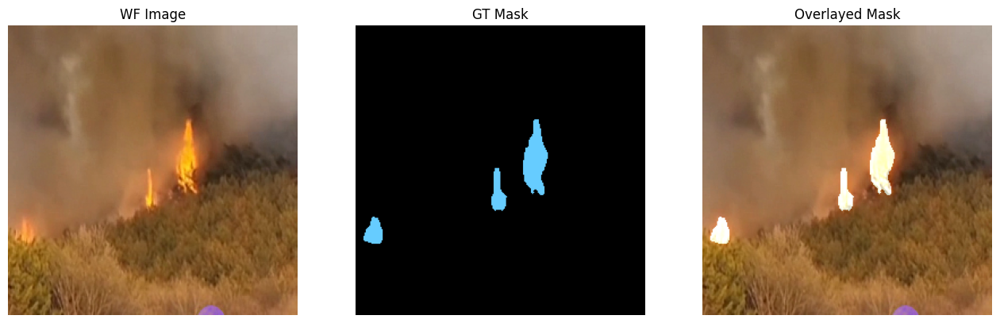

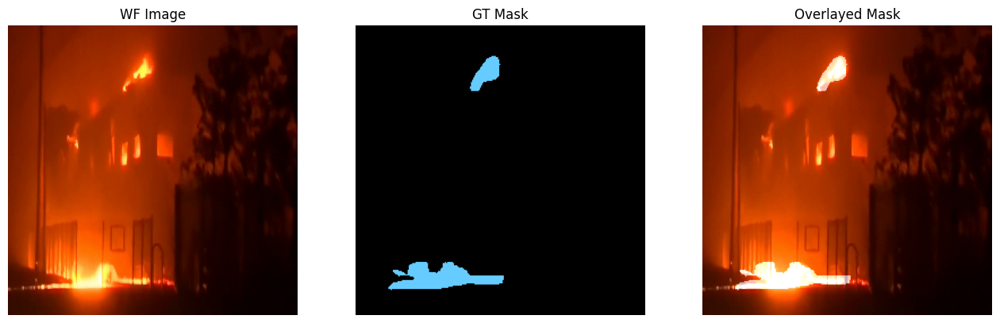

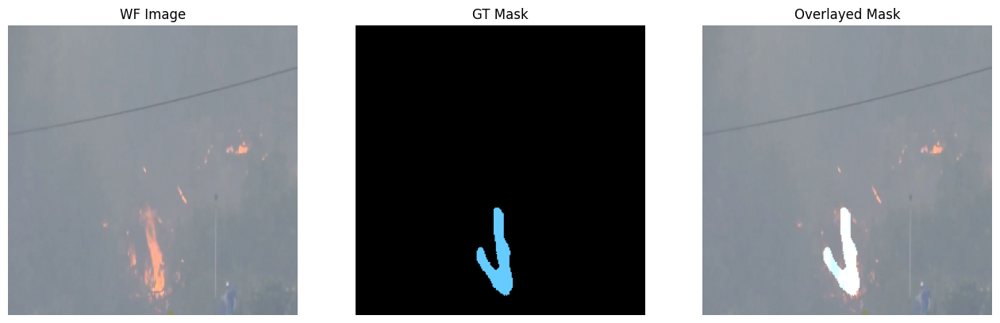

In [ ]:
plot_train_ds = train_ds.map(unpackage_inputs).batch(3)
image_batch, mask_batch = next(iter(plot_train_ds.take(1)))

titles = ["WF Image", "GT Mask", "Overlayed Mask"]

for image, gt_mask in zip(image_batch, mask_batch):

    gt_mask = tf.squeeze(gt_mask, axis=-1).numpy()
    display_image_and_mask([image.numpy().astype(np.uint8), gt_mask],
                           title_list=titles,
                           figsize=(16,6),
                           color_mask=True)

데이터 8월 데이터 증강으로 다음 변환을 사용할 수 있습니다.

랜덤 플립(기본 모드 모드 모드) 랜덤 밝기(기본 모드) 랜덤 밝기(기본 모드)입니다.

In [ ]:
augment_fn = tf.keras.Sequential(
    [
        keras_cv.layers.RandomFlip(),
        keras_cv.layers.RandomBrightness(factor=data_config.BRIGHTNESS_FACTOR,
                                         value_range=(0, 255)),
        keras_cv.layers.RandomContrast(factor=data_config.CONTRAST_FACTOR,
                                       value_range=(0, 255)),
    ]
)

In [ ]:
train_dataset = (
                train_ds.shuffle(data_config.BATCH_SIZE)
                .map(augment_fn, num_parallel_calls=tf.data.AUTOTUNE)
                .batch(data_config.BATCH_SIZE)
                .map(unpackage_inputs)
                .prefetch(buffer_size=tf.data.AUTOTUNE)
)

valid_dataset = (
                valid_ds.batch(data_config.BATCH_SIZE)
                .map(unpackage_inputs)
                .prefetch(buffer_size=tf.data.AUTOTUNE)
)

증강 데이터 시각화

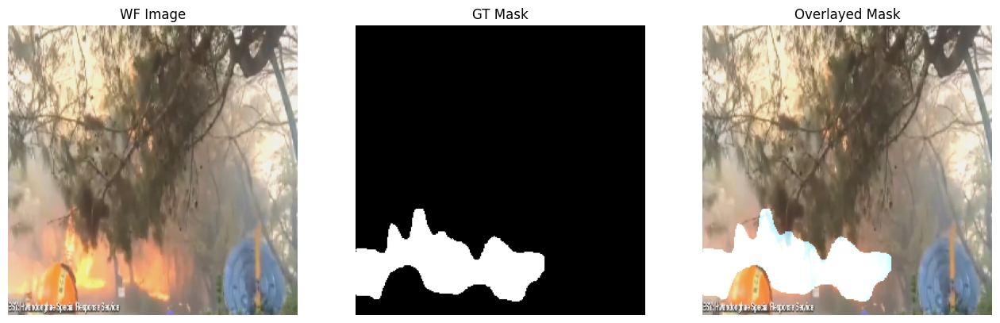

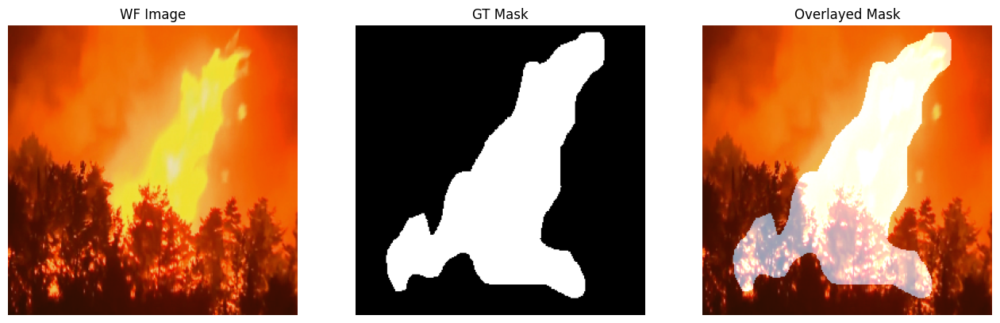

In [ ]:
image_batch, aug_mask_batch = next(iter(train_dataset.take(1)))

titles = ["WF Image", "GT Mask", "Overlayed Mask"]

for idx, (image, gt_mask) in enumerate(zip(image_batch, aug_mask_batch)):
    if idx > 1:
        break
    gt_mask = tf.squeeze(gt_mask, axis=-1).numpy()
    display_image_and_mask([image.numpy().astype(np.uint8), gt_mask],
                           title_list=titles,
                           figsize=(16,6),
                           color_mask=False)

좋은 모델 가중 모델 가중치

In [ ]:
model.load_weights(train_config.CKPT_DIR)

미세 조정 모델을 사용한 예측
이제 DeepLabv3의 모델 학습이 완료되었으므로 몇 가지 샘플 이미지에 대한 예측을 통해 테스트해 보겠습니다.

In [ ]:
def inference(model, dataset, samples_to_plot):

    num_batches_to_process = 1
    count = 0
    stop_plot = False

    titles = ["WF Image", "GT Mask", "Pred Mask", "Overlayed Prediction"]

    for idx, data in enumerate(dataset):

        if stop_plot:
            break

        batch_img, batch_mask = data[0], data[1]
        batch_pred = (model.predict(batch_img)).astype('float32')
        batch_pred = batch_pred.argmax(axis=-1)

        batch_img  = batch_img.numpy().astype('uint8')
        batch_mask = batch_mask.numpy().squeeze(axis=-1)

        for image, mask, pred in zip(batch_img, batch_mask, batch_pred):
            count+=1
            display_image_and_mask([image, mask, pred],
                                  title_list=titles,
                                   figsize=(20,8),
                                   color_mask=True)
            if count >= samples_to_plot:
                stop_plot=True
                break


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


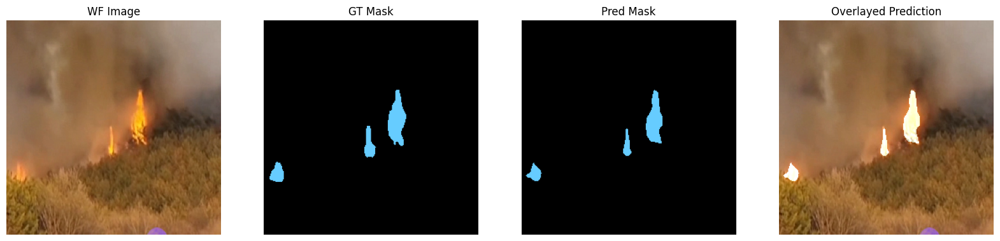

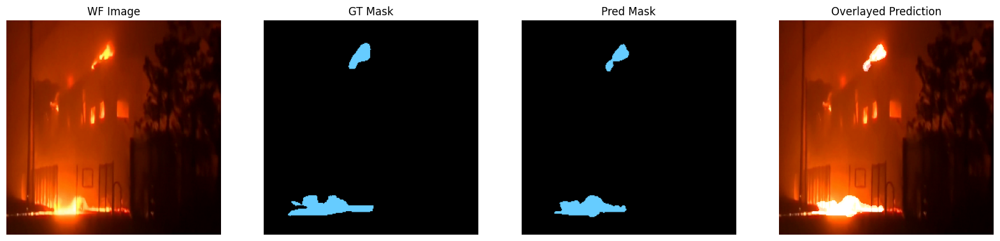

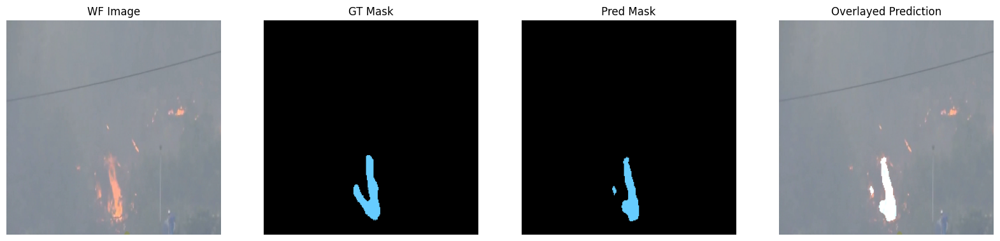

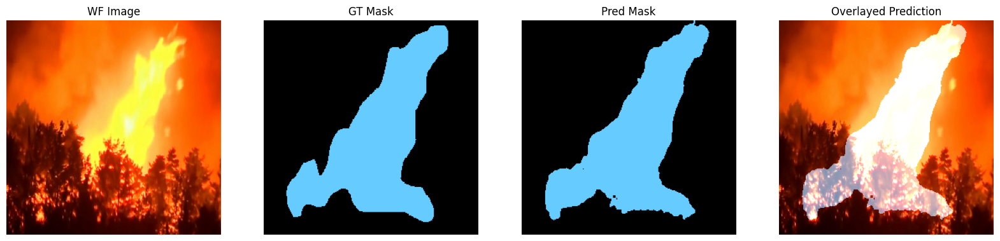

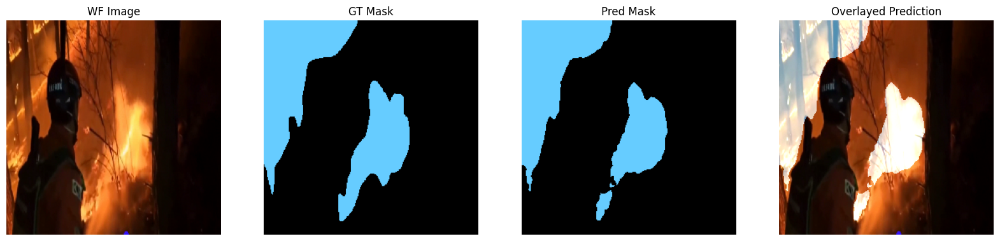

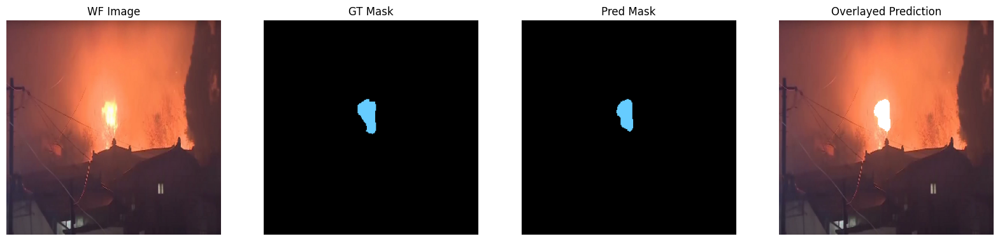

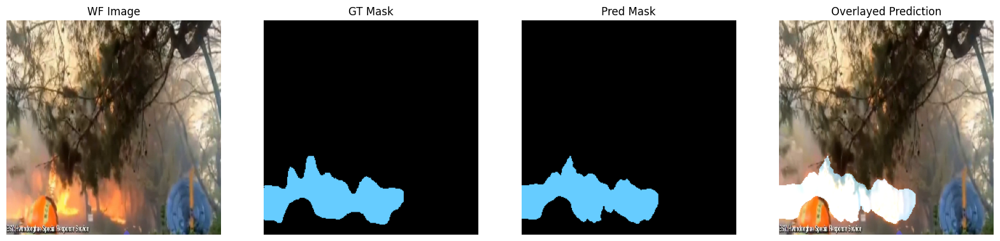

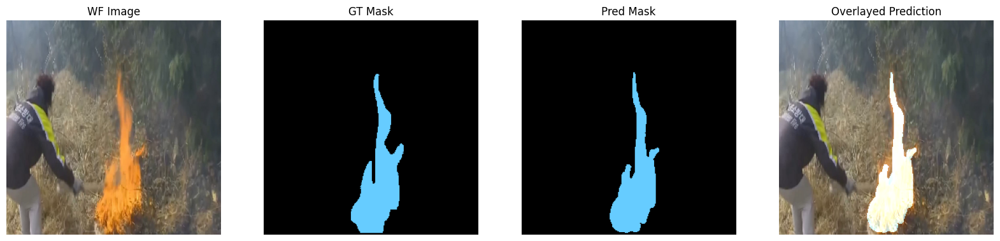

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


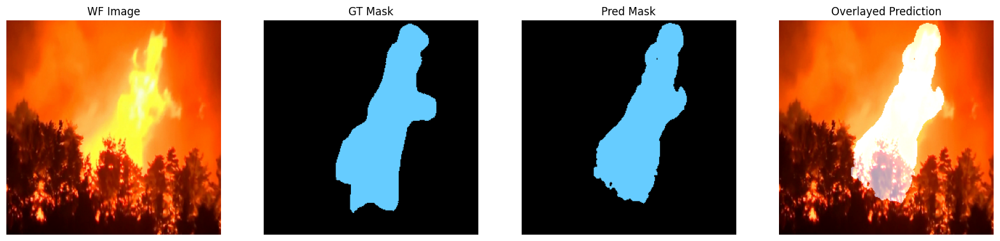

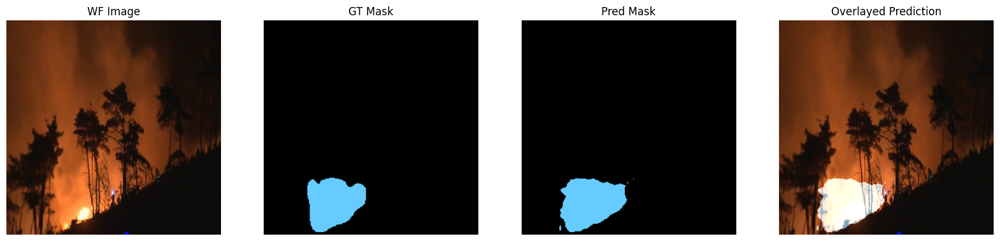

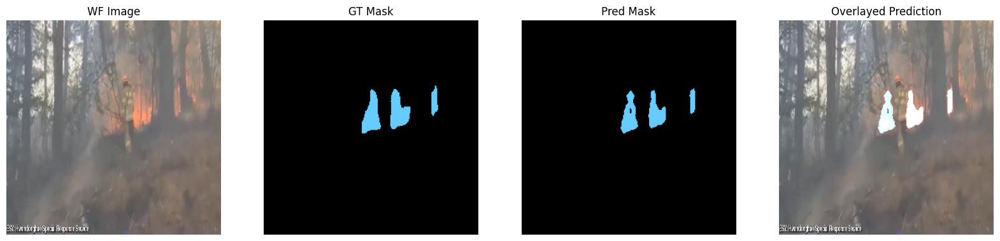

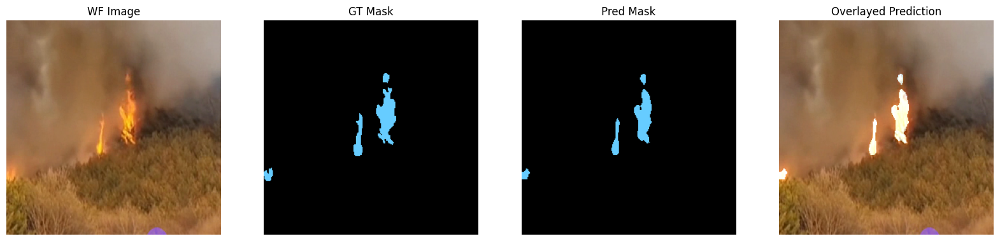

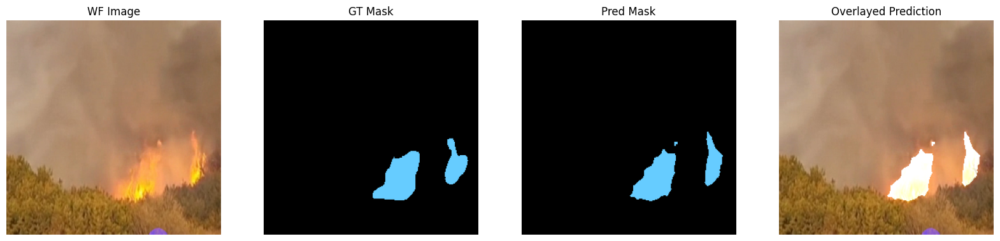

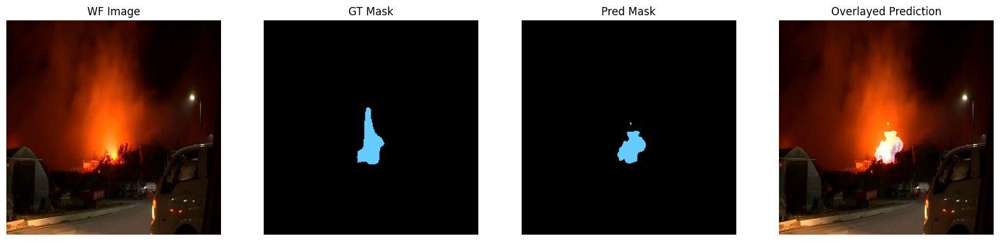

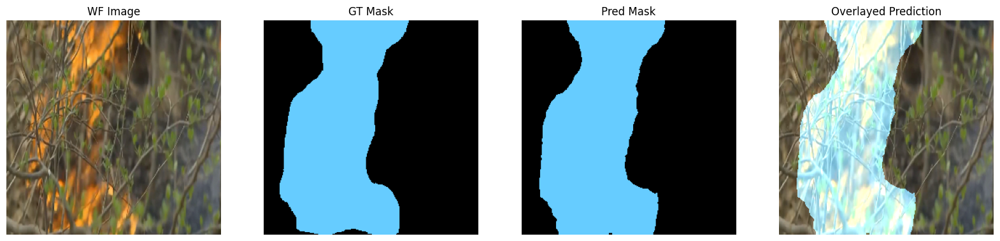

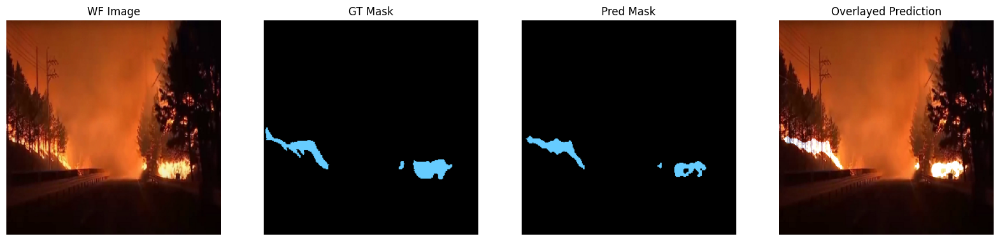

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


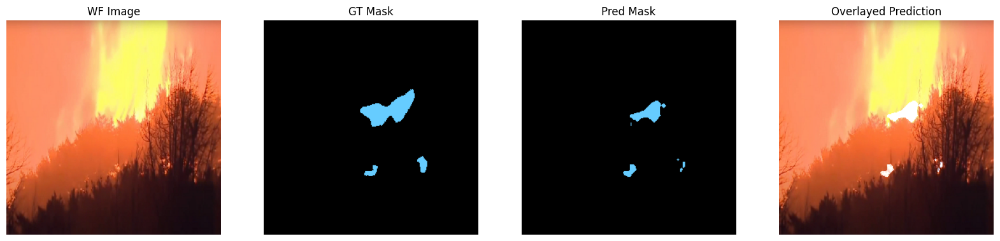

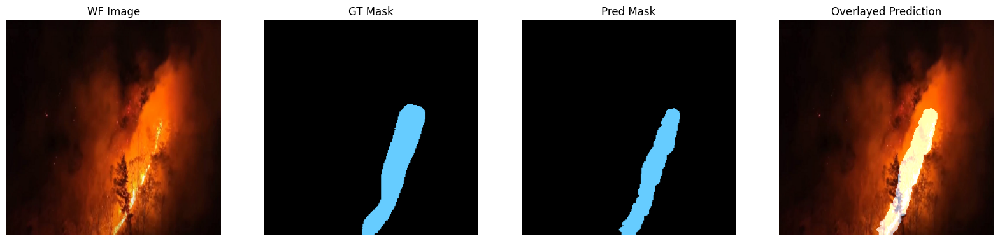

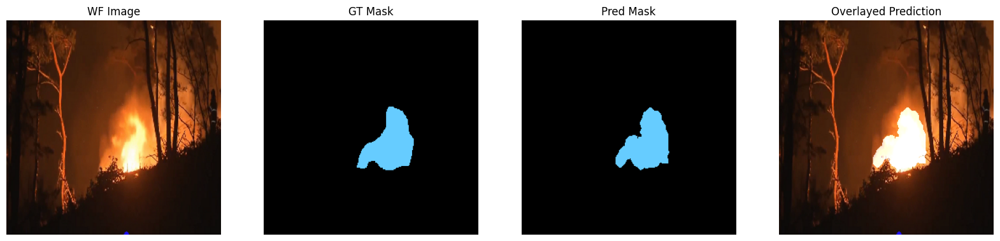

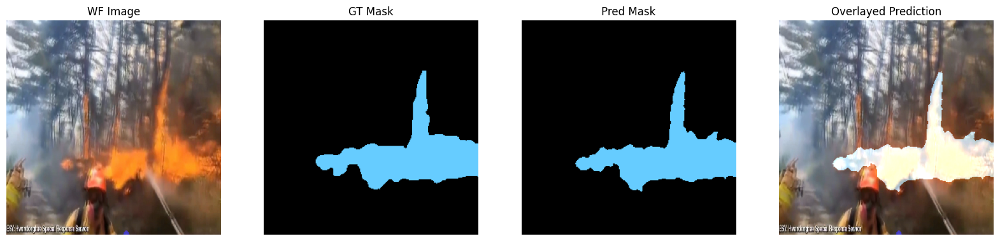

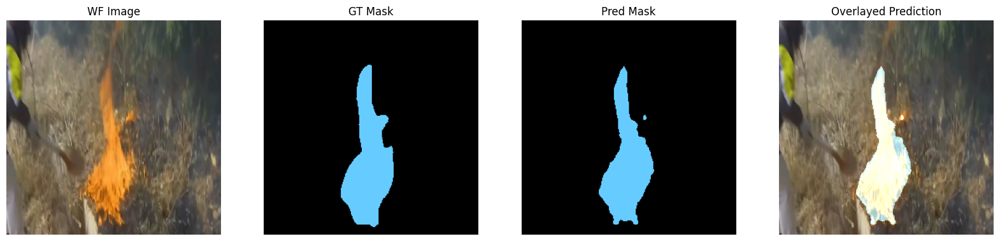

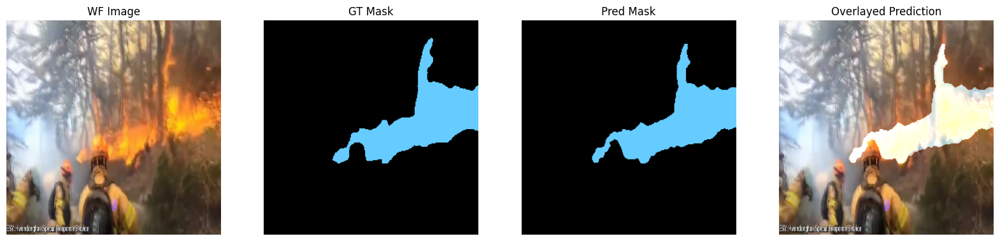

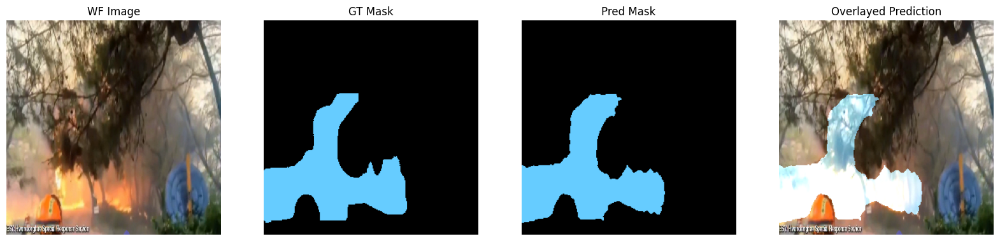

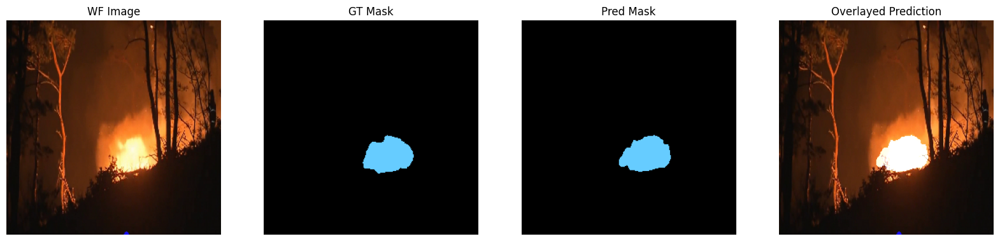

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


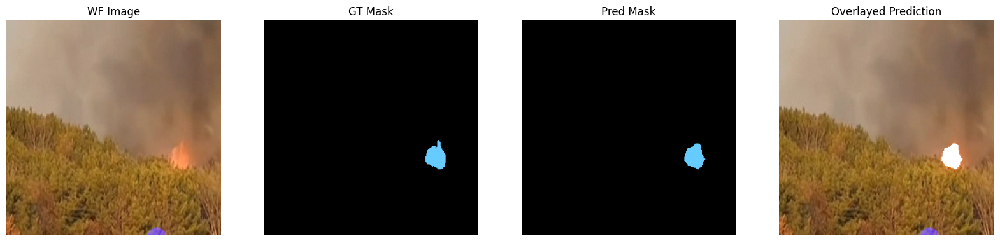

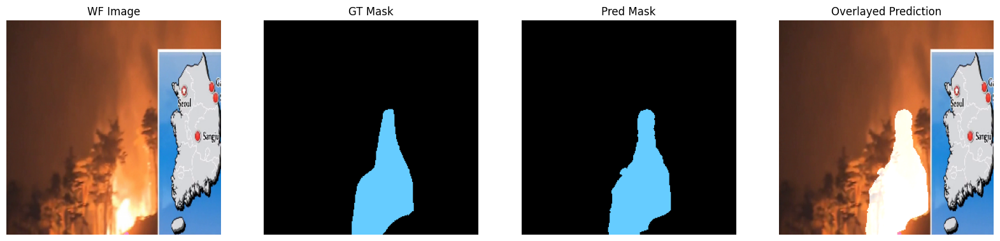

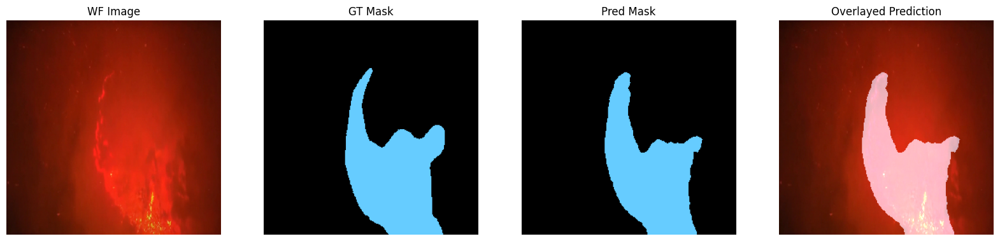

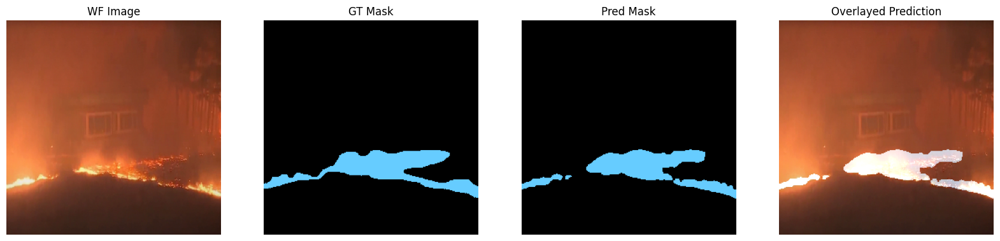

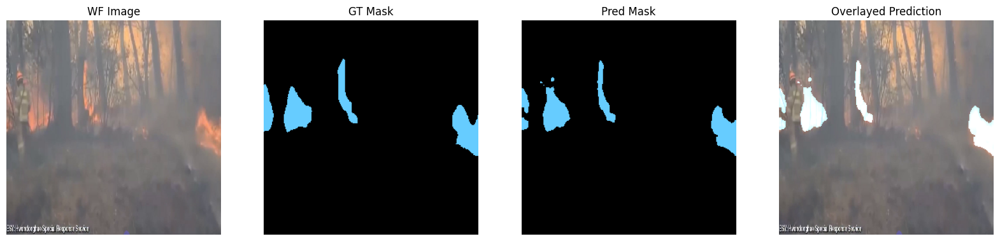

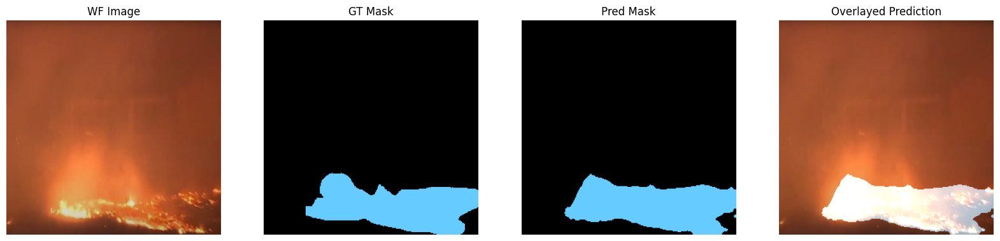

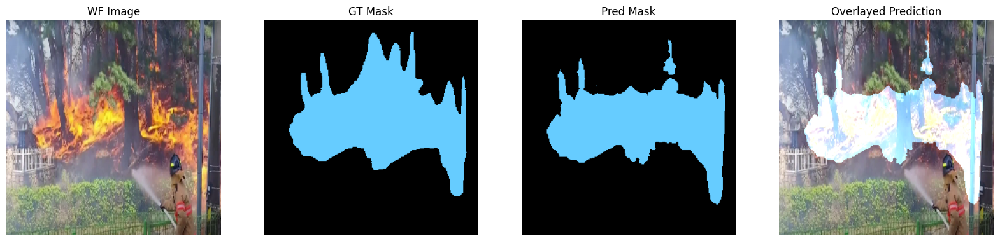

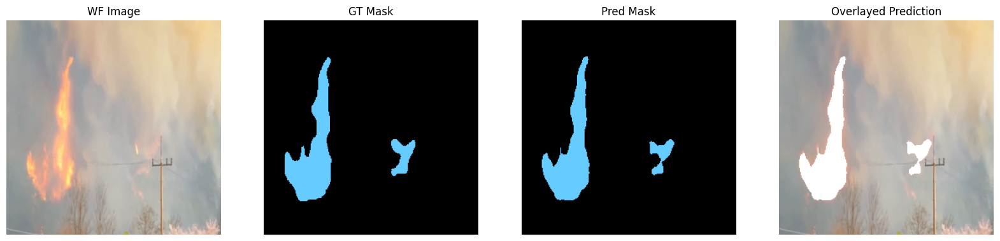

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


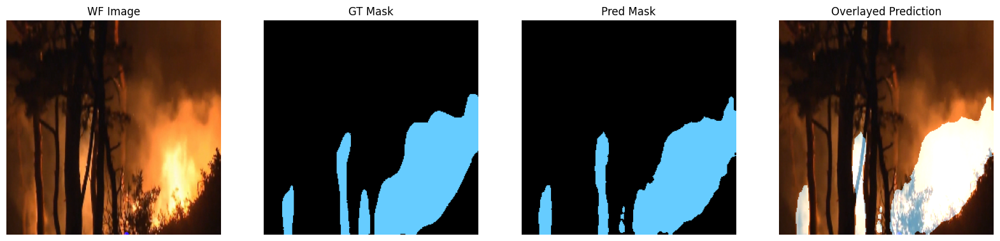

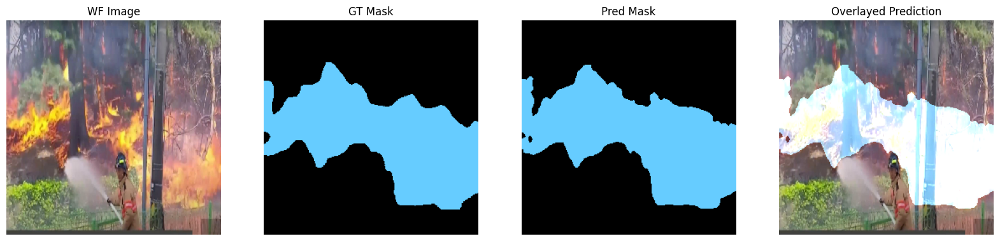

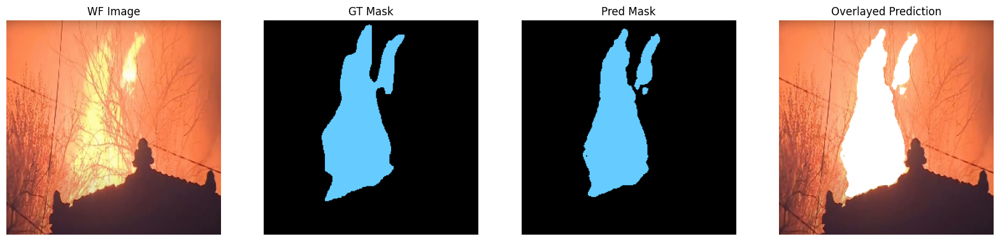

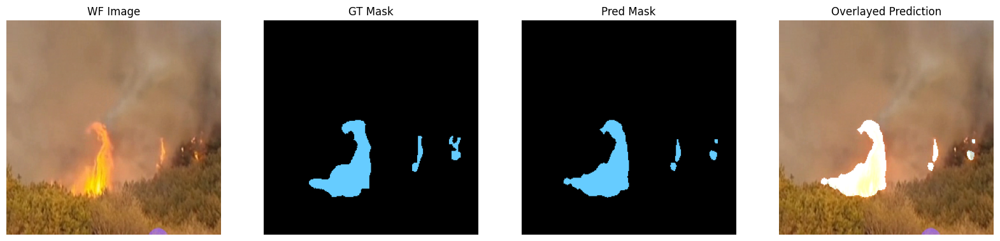

In [ ]:
inference(model, valid_dataset, samples_to_plot=36)